# Chapter8 신경망 딥러닝의 응용

퍼셉트론은 선형분리가 불가능한 문제에 대해서 해결을 해지 못했다.

이러한 문제를 해결 하기 위해서 나타난 것이 LFF(다층 피드 포워드 신경망)이다.

LFF는 선형분리가 불가능한 문제를 나누기 위해서 여러개의 직선으로 층을 나눠서 문제해결을 시도한다.

 ex) 퍼셉트론으로 풀지 못한 XOR문제를 LFF, 2개의 층으로 이뤄진 신경망을 이용하여 해결이 가능하다. 




## 8.1 MNIST 데이터베이스

In [ ]:
#-- 리스트 8-1-(1)
from keras.datasets import mnist
(x_train, y_train), (x_test, y_test) = mnist.load_data()

11501568/11490434 [==============================] - 1s 0us/step


케라스를 사용하여 데이터셋을 다운받아 진행한다.

실행하면 60,000개의 훈련용 데이터(이미지와 라벨)가 x_train, y_train에 저장되며, 10,000개의 테스트용 데이터는 x_test, y_test에 저장된다.

x_train은 60000x28x28의 배열 변수로, 각 요소는 0-255의 값을 갖는 정수이다.

i번째 이미지는 x_train[i:,:] 명령으로 꺼내 수 있다.

y_train의 각 요소는 0-9의 정수 값을 취하며, 길이가 60000인 1차원 배열 변수로, y[i]에는 이미지 i에 대응하는 0-9의 값이 포함되어 있다.

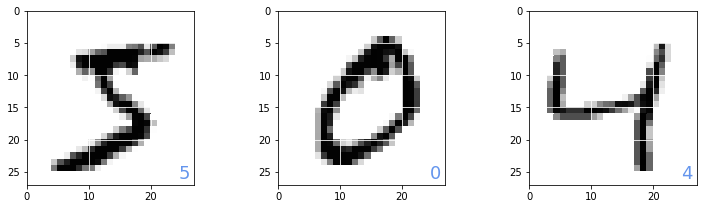

In [ ]:
# - 리스트 8-1-(2)
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(1, figsize=(12, 3.2))
plt.subplots_adjust(wspace=0.5)
plt.gray()
for id in range(3):
    plt.subplot(1, 3, id + 1)
    img = x_train[id, :, :]
    plt.pcolor(255 - img)
    plt.text(24.5, 26, "%d" % y_train[id],
             color='cornflowerblue', fontsize=18)
    plt.xlim(0, 27)
    plt.ylim(27, 0)
    plt.grid('on', color='white')
plt.show()

훈련 데이터의 이미지가 보이고 우측 하단에 목표 데이터 값을 표시했다

## 8.2 2층 피드 포워드 네트워크 모델

7장에서 다룬 2층 피드 포워드 네트워크 모델을 사용해 이 필기체 숫자의 클래스 분류 문제가 해결되는지 살펴보자.

In [ ]:
#-- 리스트 8-1-(3)
from keras.utils import np_utils


x_train = x_train.reshape(60000, 784) # (A)
x_train = x_train.astype('float32') # (B)
x_train = x_train / 255 # (C)
num_classes = 10
y_train = np_utils.to_categorical(y_train, num_classes) # (D)


x_test = x_test.reshape(10000, 784)
x_test = x_test.astype('float32')
x_test = x_test / 255
y_test = np_utils.to_categorical(y_test, num_classes)

우선 데이터를 사용하기 쉬운 형태로 변경한다.

이 네트워크는 28x28의 이미지 데이터를 784 길이의 벡터로 처리한다.

(A): 60000x28x28의 배열을 60000x784의 배열로 변환한다.

(B): 입력은 실수로 처리하고 싶으므로 int를 float으로 변환한다.

(C): 255로 나누어 0~1 사이의 실수로 반환하도록 한다.

(D): y_train의 요소는 0-9의 정수이며, np_utils.to_categorical()이라는 케라스 함수를 사용하여 1-of-K 부호화법으로 변경한다.

x_test와 y_test도 동일하게 변경한다.

In [ ]:
#-- 리스트 8-1-(4)
np.random.seed(1)
from keras.models import Sequential
from keras.layers import Dense, Activation
from tensorflow.keras.optimizers import Adam


model = Sequential() # (A)
model.add(Dense(16, input_dim=784, activation='sigmoid')) # (B)
model.add(Dense(10, activation='softmax')) # (C)
model.compile(loss='categorical_crossentropy',
optimizer=Adam(), metrics=['accuracy']) # (D)

(A): model을 Sequential()로 정의
(B): 784차원 입력을 갖는 16개의 중간층
(C): 10개의 출력층
(D): model.compile() 인수에 optimizer=Adam()을 통해 알고리즘을 Adam으로 설정
* Adam은 경사 하강법을 더 세련되게 만든 것

In [ ]:
#-- 리스트 8-1-(5)
import time


startTime = time.time()
history = model.fit(x_train, y_train, epochs=10, batch_size=1000,
                    verbose=1, validation_data=(x_test, y_test)) # (A)
score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])
print("Computation time:{0:.3f} sec".format(time.time() - startTime))

Epoch 1/10
60/60 [==============================] - 4s 17ms/step - loss: 2.0127 - accuracy: 0.4173 - val_loss: 1.7221 - val_accuracy: 0.6552
Epoch 2/10
60/60 [==============================] - 1s 13ms/step - loss: 1.5492 - accuracy: 0.7074 - val_loss: 1.3740 - val_accuracy: 0.7442
Epoch 3/10
60/60 [==============================] - 1s 8ms/step - loss: 1.2610 - accuracy: 0.7573 - val_loss: 1.1322 - val_accuracy: 0.7913
Epoch 4/10
60/60 [==============================] - 1s 11ms/step - loss: 1.0534 - accuracy: 0.7948 - val_loss: 0.9556 - val_accuracy: 0.8288
Epoch 5/10
60/60 [==============================] - 1s 11ms/step - loss: 0.9007 - accuracy: 0.8310 - val_loss: 0.8256 - val_accuracy: 0.8482
Epoch 6/10
60/60 [==============================] - 1s 8ms/step - loss: 0.7867 - accuracy: 0.8520 - val_loss: 0.7279 - val_accuracy: 0.8679
Epoch 7/10
60/60 [==============================] - 1s 12ms/step - loss: 0.6996 - accuracy: 0.8680 - val_loss: 0.6522 - val_accuracy: 0.8823
Epoch 8/10
60/6

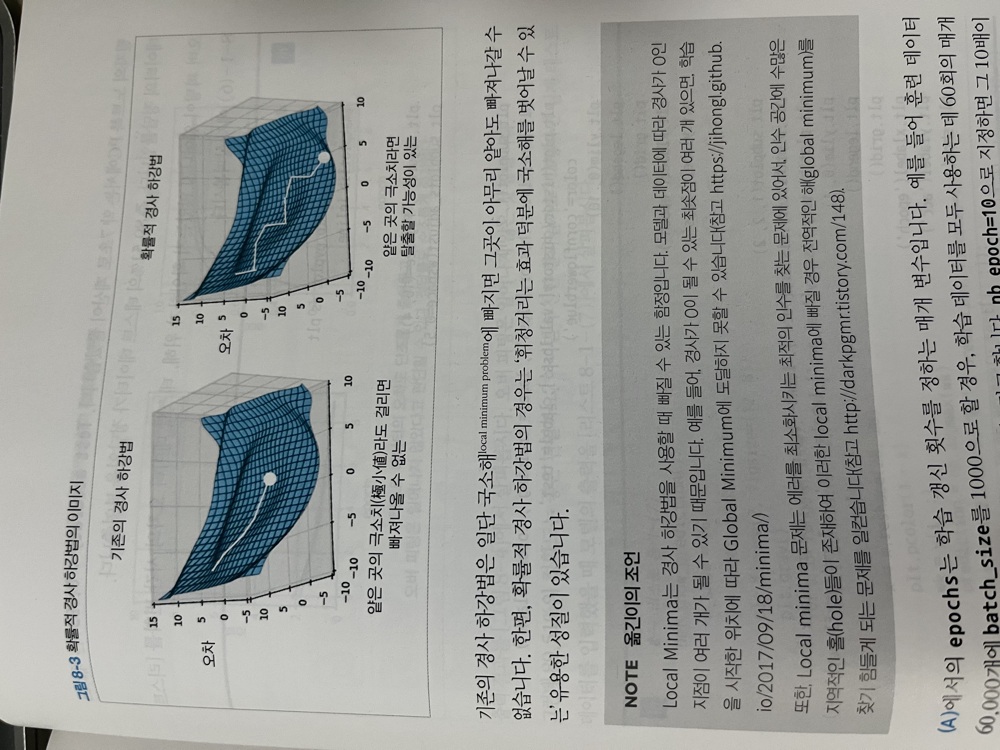

###Local minima 문제
에러를 최소화시키는 최적의 인수를 찾는 문제에 있어서, 인수 공간에 수많은 지역적인 홀(hole)들이 존재하여 이러한 local miuma에 빠질 경우 전역적인 해(global minimum)을 찾기 힘들게 되는 문제

### 확률적 경사하강법이란?
데이터의 일부로 오차 함수의 기울기를 계산하는 것.

why? 데이터가 크면 계산에 많은 시간이 걸린다.

일부 데이터셋에서 계산된 기울기 방향은 전체 데이터셋에서 계산된 실제 기울기 방향과는 약간 다르다.

즉, 전체 오차를 최소화하는 방향으로 곧장 나아가는 것이 아니라, 노이즈의 영향을 받는 것처럼 휘청거리면서 서서히 오차가 낮은 방향으로 나아간다.

기존의 배치경사하강법

-> 국소해(local minimum problem)에 빠지면 아무리 얕아도 빠져나갈 수 없다.

확률적 경사하강법

-> '휘청거리는 효과 덕분에 국소해를 벗어날 수 있는' 성질

무작위성으로 요동치며 local minima에 걸리지 않고 빠르게 수렴할 수 있다.



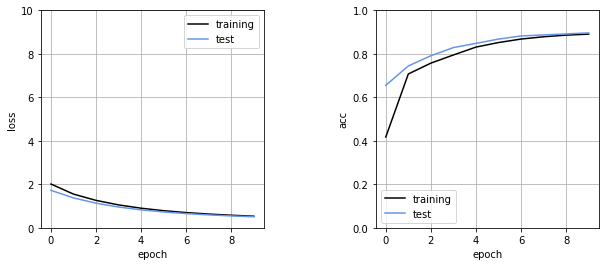

In [ ]:
#-- 리스트 8-1-(6)
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


plt.figure(1, figsize=(10, 4))
plt.subplots_adjust(wspace=0.5)


plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='training', color='black')
plt.plot(history.history['val_loss'], label='test',
         color='cornflowerblue')
plt.ylim(0, 10)
plt.legend()
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss')


plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='training', color='black')
plt.plot(history.history['val_accuracy'],label='test', color='cornflowerblue')
plt.ylim(0, 1)
plt.legend()
plt.grid()
plt.xlabel('epoch')
plt.ylabel('acc')
plt.show()

오버피팅이 일어나지 않고 잘 학습되었다.

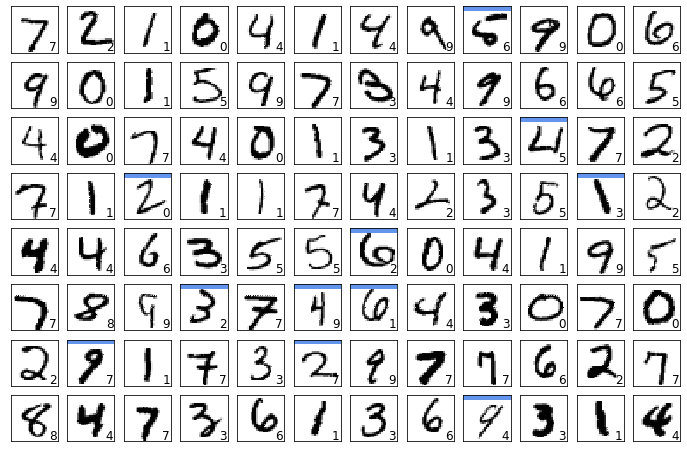

In [ ]:
#-- 리스트 8-1-(7)
def show_prediction():
    n_show = 96
    y = model.predict(x_test) # (A)
    plt.figure(2, figsize=(12, 8))
    plt.gray()
    for i in range(n_show):
        plt.subplot(8, 12, i + 1)
        x = x_test[i, :]
        x = x.reshape(28, 28)
        plt.pcolor(1 - x)
        wk = y[i, :]
        prediction = np.argmax(wk)
        plt.text(22, 25.5, "%d" % prediction, fontsize=12)
        if prediction != np.argmax(y_test[i, :]):
            plt.plot([0, 27], [1, 1], color='cornflowerblue', linewidth=5)
        plt.xlim(0, 27)
        plt.ylim(27, 0)
        plt.xticks([], "")
        plt.yticks([], "")
#-- 메인
show_prediction()
plt.show()

정확도는 89.51%(저자 기준)이지만,

아무리 봐도 3인데 2라고 답하는 등 불만족스럽다

## 8.3 ReLU 활성화 함수

활성화함수는 전통적으로 시그모이드 함수가 사용되었지만 최근에는 ReLU라는 활성함수가 자주 사용된다.

2015년에 얀, 벤지오, 힌튼이 네이처에 발표한 논문에서는 ReLU가 활성화함수로서 최선이라고 하였다.

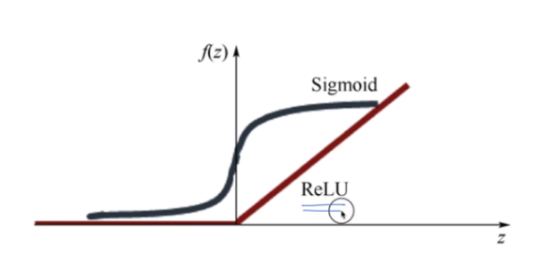

퍼셉트론이 xor(배타적 논리합) 문제를 해결하지 못해서

sigmoid 함수를 도입했다.

그런데, layer가 깊어질수록 sigmoid 함수를 쓰면 정확도가 급격하게 떨어진다.

why? 
입력x가 어느 정도 커지면 항상 1에 가까운 값을 출력하기 때문에, 입력의 변화가 출력에 반영되기 어렵다.
오류역전파 과정에서 가중치 매개 변수에 대한 편미분이 0에 가까운 값을 가지기 때문에 반복해서 곱하다보면 결과값이 0에 수렴 (Vanishing gradient)

-> ReLU 함수 등장

: 값이 1 이하로 한정된 부분을 없애버렸다.

네트워크 중간층의 활성화 함수를 ReLU 로 바꾸어 실행해보자.

중간층의 activation을 'sigmoid' 에서 'relu'로 바꾸었다.

In [ ]:
#-- 리스트 8-1-(8)
np.random.seed(1)
from keras.models import Sequential
from keras.layers import Dense, Activation
from tensorflow.keras.optimizers import Adam


model = Sequential()
model.add(Dense(16, input_dim=784, activation='relu')) # (A)
model.add(Dense(10, activation='softmax'))
model.compile(loss='categorical_crossentropy',
              optimizer=Adam(), metrics=['accuracy'])


startTime = time.time()
history = model.fit(x_train, y_train, batch_size=1000, epochs=10,
                    verbose=1, validation_data=(x_test, y_test))
score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])
print("Computation time:{0:.3f} sec".format(time.time() - startTime))

Epoch 1/10
60/60 [==============================] - 1s 10ms/step - loss: 1.5821 - accuracy: 0.5197 - val_loss: 0.9453 - val_accuracy: 0.8124
Epoch 2/10
60/60 [==============================] - 0s 6ms/step - loss: 0.7010 - accuracy: 0.8431 - val_loss: 0.5310 - val_accuracy: 0.8694
Epoch 3/10
60/60 [==============================] - 0s 7ms/step - loss: 0.4797 - accuracy: 0.8773 - val_loss: 0.4201 - val_accuracy: 0.8905
Epoch 4/10
60/60 [==============================] - 0s 7ms/step - loss: 0.4020 - accuracy: 0.8932 - val_loss: 0.3686 - val_accuracy: 0.9023
Epoch 5/10
60/60 [==============================] - 0s 6ms/step - loss: 0.3598 - accuracy: 0.9024 - val_loss: 0.3366 - val_accuracy: 0.9081
Epoch 6/10
60/60 [==============================] - 0s 6ms/step - loss: 0.3319 - accuracy: 0.9094 - val_loss: 0.3150 - val_accuracy: 0.9129
Epoch 7/10
60/60 [==============================] - 0s 6ms/step - loss: 0.3113 - accuracy: 0.9143 - val_loss: 0.2975 - val_accuracy: 0.9180
Epoch 8/10
60/60 [=

약 92~95%정도의 정확도가 나왔고 sigmoid 함수를 사용한 결과와 비교하면 약 3%의 정확도가 올랐다.

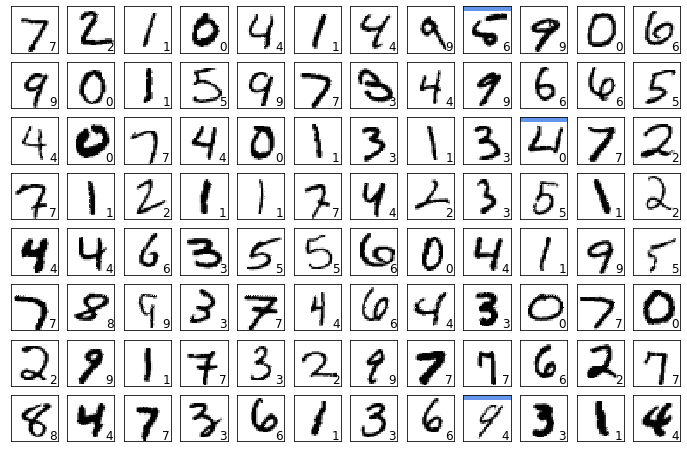

In [ ]:
# 리스트 8-1-(9)
show_prediction()
plt.show()

수치상으로 단 3% 향상한 것이지만 실제 성능을 보면 3%는 큰 개선이다.




###그러면 이 네트워크는 어떤 매개 변수를 획득했을까?

중간층 가중치 매개 변수를 그림으로 나타내보자.

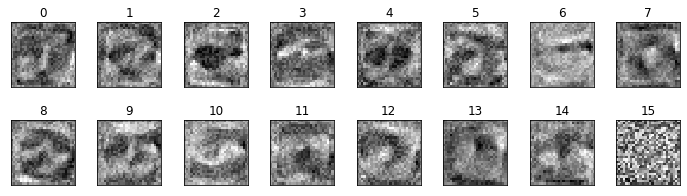

In [ ]:
#-- 리스트 8-1-(10)
# 1층째의 무게 시각화
w = model.layers[0].get_weights()[0]
plt.figure(1, figsize=(12, 3))
plt.gray()
plt.subplots_adjust(wspace=0.35, hspace=0.5)
for i in range(16):
    plt.subplot(2, 8, i + 1)
    w1 = w[:, i]
    w1 = w1.reshape(28, 28)
    plt.pcolor(-w1)
    plt.xlim(0, 27)
    plt.ylim(27, 0)
    plt.xticks([], "")
    plt.yticks([], "")
    plt.title("%d" % i)
plt.show()

ReLU 네트워크가 학습 후 획득한 입력부터 중간층 뉴런까지의 가중치.

검은 부분이 양의 값, 흰색 부분이 음의 값을 나타낸다.

검은 부분에 입력 이미지가 있으면 그 유닛은 활성화하고, 반대로 흰색 부분에 입력 이미지가 있는 유닛은 억제된다.

27 x 27 의 입력으로부터 중간층의 16개 뉴런에 대한 가중치를 그리고 있다.

가중치 값이 양수이면 검은색으로, 음수인 경우에는 흰색으로 표시한다.

초기 가중치는 임의로 설정되어 있었으므로, 이 모습은 학습에 의해 획득한 것이다.

검은 부분에 문자 일부분이 있으면 뉴런을 활성화하고, 흰 부분에 문자 일부분이 있으면 억제된다.

예를 들어, 12번 뉴런의 가중치는 중심에 희미하게 2의 형태가 검게 나타나고 있다.

즉, 이 뉴런은 2의 이미지에서 활동이 증가하는 뉴런이다. 아마 2를 인식하는 데 도움될 것이다.

다른 뉴런도 특정 숫자의 특징에 반응하는 것으로 추측할 수 있다.



---


정답률이 약 93%로 높다.

그러나 2차원 공간 정보를 전혀 사용하지 않고 있다.

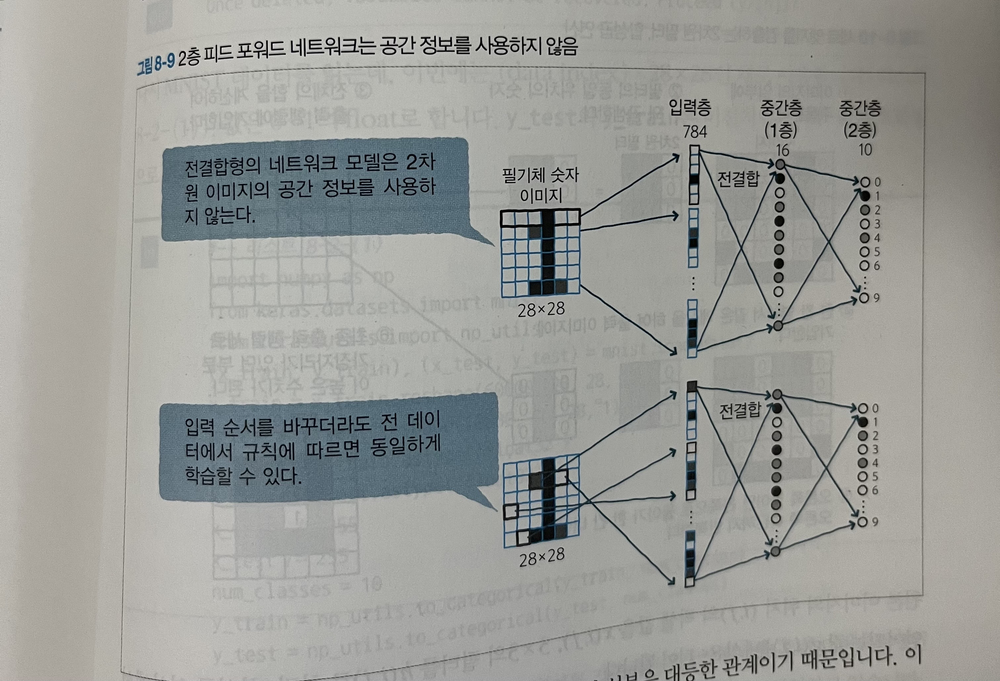

그 이유는 네트워크의 구조가 전결합형이며, 모든 입력 성분은 대등한 관계이기 때문.

이웃에 있는 입력 성분도, 멀리 떨어지니 입력 성분도 수식상으로 똑같은 관계이다.

따라서, 공간 정보가 사용되고 있지 않다.

## 공간 필터

공간 정보란 직선, 곡선, 원형이나 사각형 같은 모양을 나타내는 정보

이러한 형태를 골라내는 방법으로 '공간 필터'라는 이미지 처리법이 있다.

필터는 2차원 행렬로 표현한다. 

2차원 행렬의 하나로, 세로 엣지를 강조하는 3x3 필터의 예를 아래 그림으로 나타냈다. 

이미지의 일부분과 필터 요소를 곱한 합을, 이미지를 슬라이드 시키면서 이미지의 전 영역에서 구한다.

이러한 계산을 '합성곱 연산' 이라고 한다.

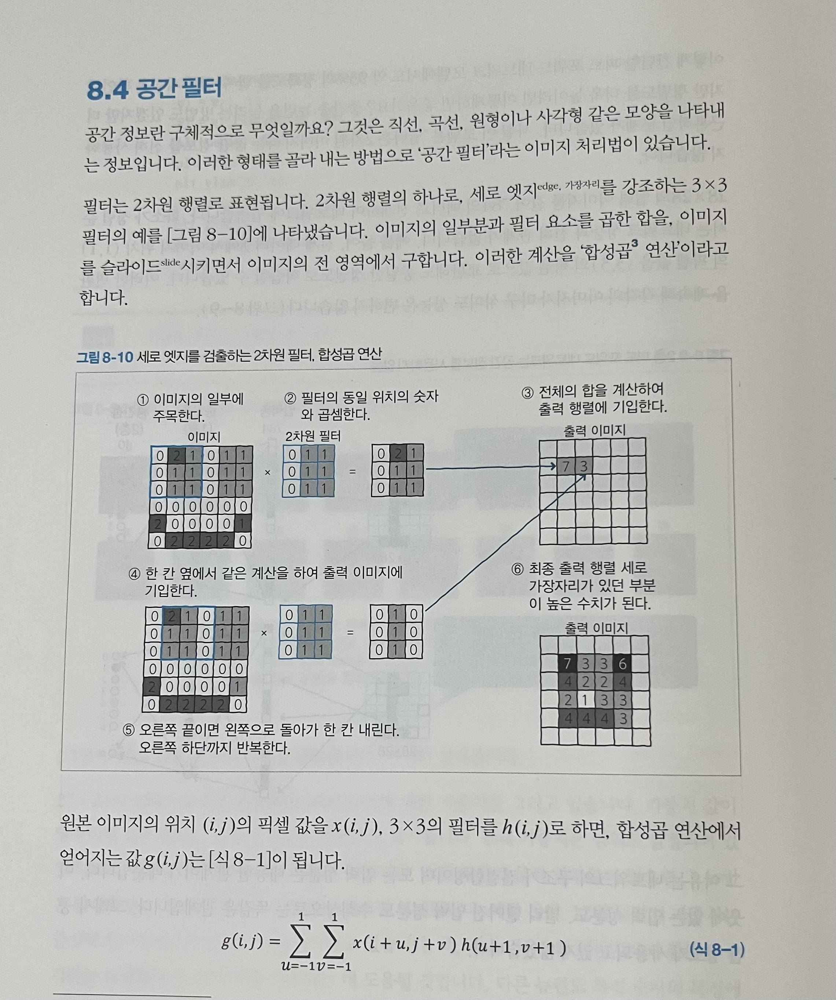

In [ ]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


MNIST 데이터를 읽는데 이번에는 (data index) x 28 x 28인 채로 사용한다. 

값은 0~1 사이의 float으로 한다. 

y_test 와 y_train은 이전처럼 1-of-k 부호화법으로 변환한다.

In [ ]:
#-- 리스트 8-2-(1)
import numpy as np
from keras.datasets import mnist
from keras.utils import np_utils
(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train = x_train.reshape(60000, 28, 28, 1)
x_test = x_test.reshape(10000, 28, 28, 1)
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255
x_test /= 255
num_classes = 10
y_train = np_utils.to_categorical(y_train, num_classes)
y_test = np_utils.to_categorical(y_test, num_classes)

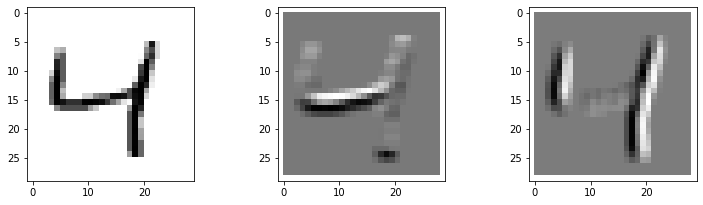

In [ ]:
#-- 리스트 8-2-(2)
import matplotlib.pyplot as plt
%matplotlib inline


id_img = 2
myfil1 = np.array([[1, 1, 1],
                   [1, 1, 1],
                   [-2, -2, -2]], dtype=float) # (A)
myfil2 = np.array([[-2, 1, 1],
                   [-2, 1, 1],
                   [-2, 1, 1]], dtype=float) # (B)


x_img = x_train[id_img, :, :, 0]
img_h = 28
img_w = 28
x_img = x_img.reshape(img_h, img_w)
out_img1 = np.zeros_like(x_img)
out_img2 = np.zeros_like(x_img)

# 필터 처리
for ih in range(img_h - 3):
    for iw in range(img_w - 3):
        img_part = x_img[ih:ih + 3, iw:iw + 3]
        out_img1[ih + 1, iw + 1] = \
            np.dot(img_part.reshape(-1), myfil1.reshape(-1))
        out_img2[ih + 1, iw + 1] = \
            np.dot(img_part.reshape(-1), myfil2.reshape(-1)) 


# - 표시
plt.figure(1, figsize=(12, 3.2))
plt.subplots_adjust(wspace=0.5)
plt.gray()
plt.subplot(1, 3, 1)
plt.pcolor(1 - x_img)
plt.xlim(-1, 29)
plt.ylim(29, -1)
plt.subplot(1, 3, 2)
plt.pcolor(-out_img1)
plt.xlim(-1, 29)
plt.ylim(29, -1)
plt.subplot(1, 3, 3)
plt.pcolor(-out_img2)
plt.xlim(-1, 29)
plt.ylim(29, -1)
plt.show()

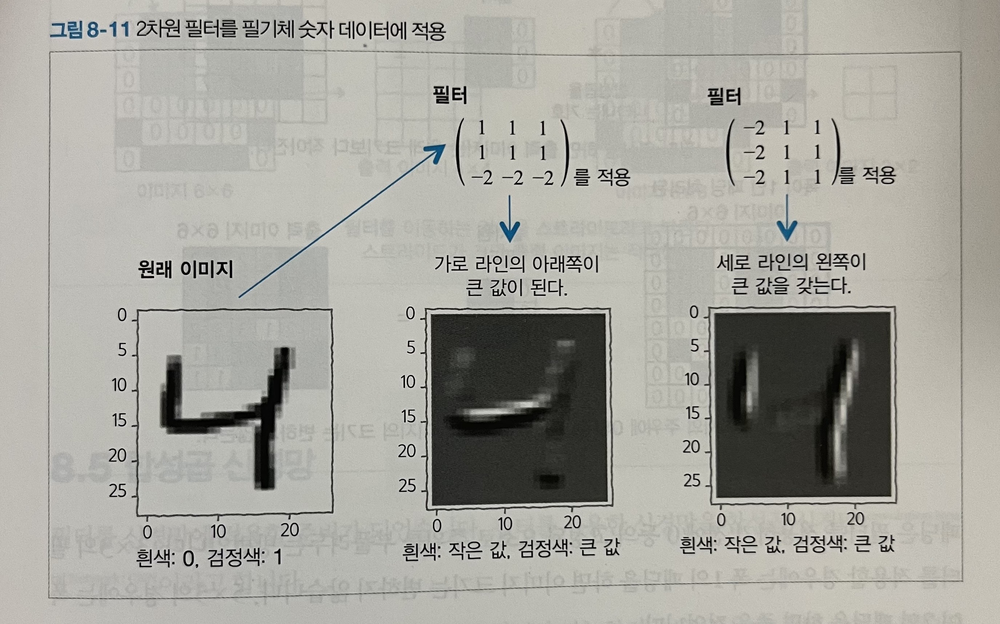

필터의 수치를 바꾸는 것으로 대각선 엣지 강조, 이미지 스무딩, 세부 부분의 강조 등 다양한 처리가 가능하다고 한다.

필터의 모든 요소를 합하면 0이 되도록 디자인하였다.

-> 공간 구조가 없는 균일한 부분은 0으로 변환되어, 0을 감지 레벨의 기준으로 세울 수 있다.

그런데, 필터를 적용하면 출력 이미지 크기가 작아진다.

연속으로 다양한 필터를 적용하면 이미지가 점점 작아져 버린다.

-> 대응책: 패딩

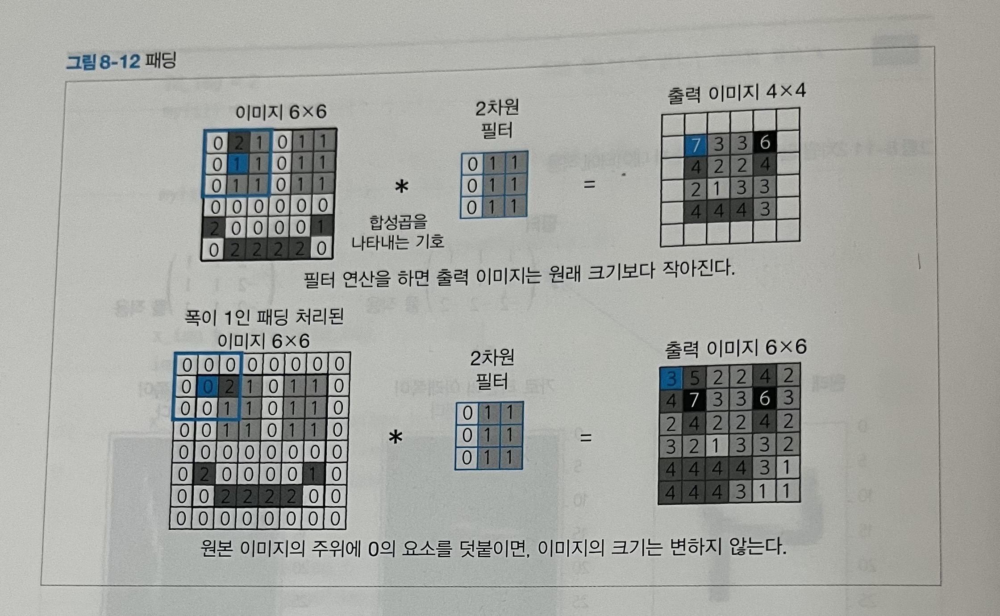

필터를 적용하기 전에 0 등의 고정된 요소로 주위를 부풀려두는 방법이다.

3x3 필터를 적용할 경우 폭 1의 패딩을 하면 이미지 크기가 변하지 않는다.

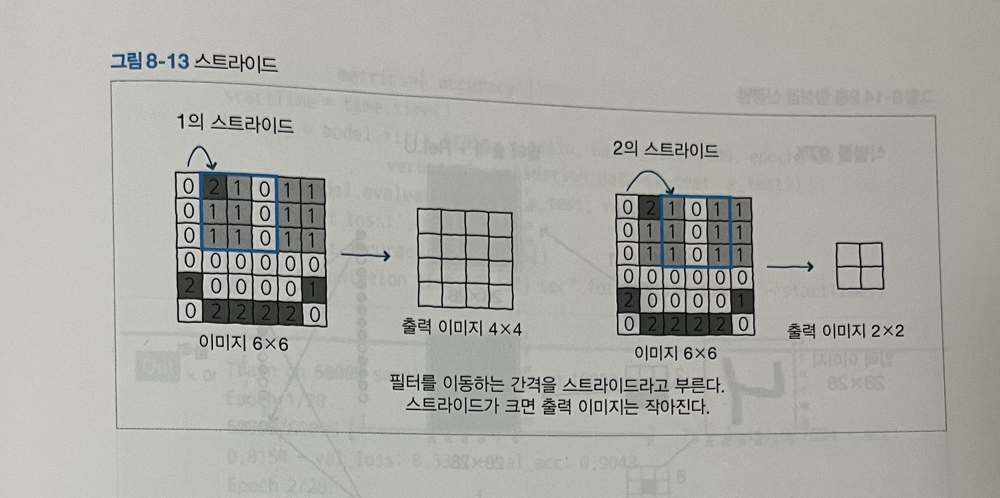

필터 처리와 관련된 다른 매개 변수로 스트라이드가 있다.

지금까지는 필터를 한 칸씩 이동했지만, 2칸이나 3칸 등 어떤 간격으로도 이동할 수 있다.

이 간격을 스트라이드(stride)라고 한다.

스트라이드를 크게 하면 출력 이미지가 작아진다.

패딩과 스트라이드 값은 라이브러리로 합성곱 네트워크를 사용할 때 인수로 전달된다.



---

### 요즘 경향

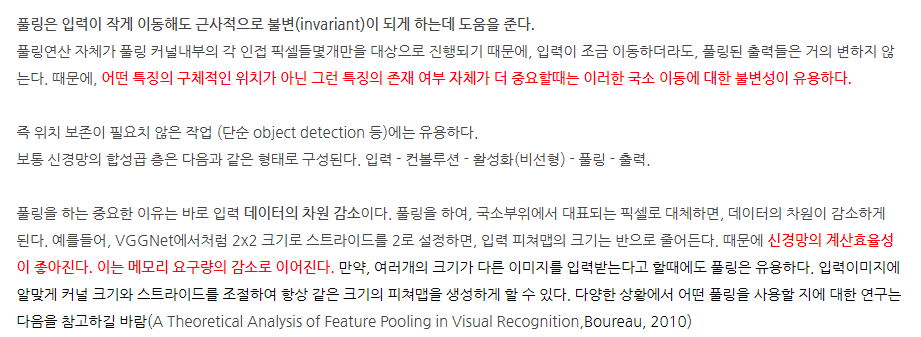

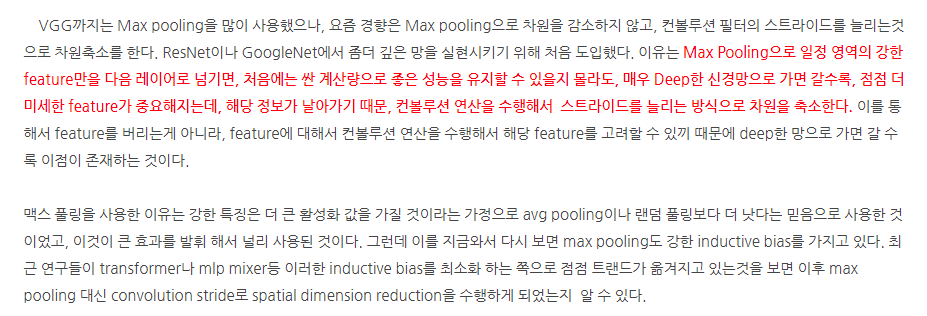

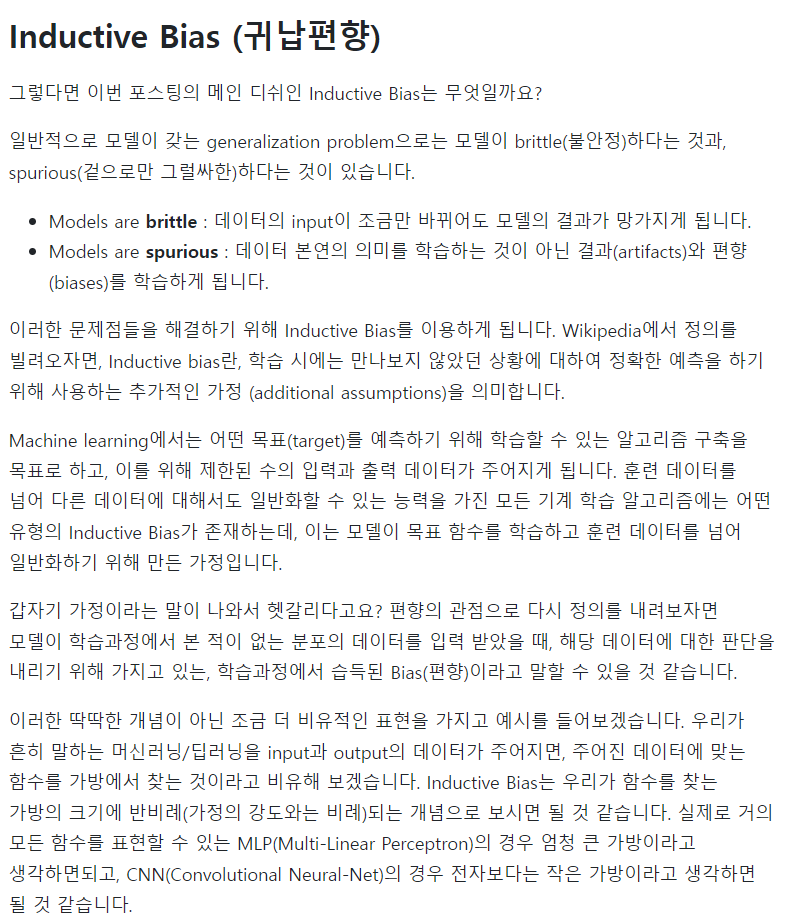

https://velog.io/@euisuk-chung/Inductive-Bias%EB%9E%80

In [ ]:
#-- 리스트 8-2-(3)
import numpy as np
np.random.seed(1)
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from tensorflow.keras.optimizers import Adam
import time


model = Sequential()
model.add(Conv2D(8, (3, 3), padding='same',
                 input_shape=(28, 28, 1), activation='relu')) # (A)
model.add(Flatten()) # (B)
model.add(Dense(10, activation='softmax'))
model.compile(loss='categorical_crossentropy',
              optimizer=Adam(),
              metrics=['accuracy'])
startTime = time.time()
history = model.fit(x_train, y_train, batch_size=1000, epochs=20,
                    verbose=1, validation_data=(x_test, y_test))
score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])
print("Computation time:{0:.3f} sec".format(time.time() - startTime))

Epoch 1/20
60/60 [==============================] - 9s 21ms/step - loss: 0.8566 - accuracy: 0.7981 - val_loss: 0.3516 - val_accuracy: 0.9040
Epoch 2/20
60/60 [==============================] - 1s 16ms/step - loss: 0.3198 - accuracy: 0.9100 - val_loss: 0.2734 - val_accuracy: 0.9246
Epoch 3/20
60/60 [==============================] - 1s 15ms/step - loss: 0.2639 - accuracy: 0.9255 - val_loss: 0.2347 - val_accuracy: 0.9355
Epoch 4/20
60/60 [==============================] - 1s 15ms/step - loss: 0.2284 - accuracy: 0.9366 - val_loss: 0.2073 - val_accuracy: 0.9423
Epoch 5/20
60/60 [==============================] - 1s 15ms/step - loss: 0.1982 - accuracy: 0.9445 - val_loss: 0.1818 - val_accuracy: 0.9509
Epoch 6/20
60/60 [==============================] - 1s 14ms/step - loss: 0.1725 - accuracy: 0.9516 - val_loss: 0.1619 - val_accuracy: 0.9560
Epoch 7/20
60/60 [==============================] - 1s 14ms/step - loss: 0.1515 - accuracy: 0.9580 - val_loss: 0.1450 - val_accuracy: 0.9598
Epoch 8/20
60

In [ ]:
#-- 리스트 8-1-(7)
def show_prediction():
    n_show = 96
    y = model.predict(x_test) # (A)
    plt.figure(2, figsize=(12, 8))
    plt.gray()
    for i in range(n_show):
        plt.subplot(8, 12, i + 1)
        x = x_test[i, :]
        x = x.reshape(28, 28)
        plt.pcolor(1 - x)
        wk = y[i, :]
        prediction = np.argmax(wk)
        plt.text(22, 25.5, "%d" % prediction, fontsize=12)
        if prediction != np.argmax(y_test[i, :]):
            plt.plot([0, 27], [1, 1], color='cornflowerblue', linewidth=5)
        plt.xlim(0, 27)
        plt.ylim(27, 0)
        plt.xticks([], "")
        plt.yticks([], "")

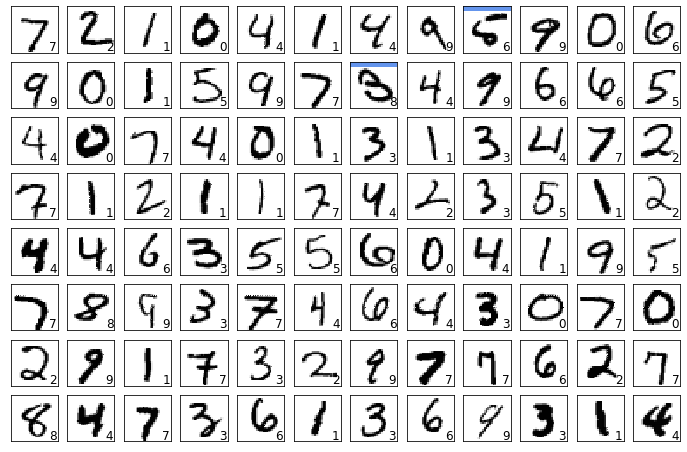

In [ ]:
# 리스트 8-2-(4)
show_prediction()
plt.show()

정확도 97.07%(저자 기준) 으로 2층 ReLU 네트워크 92.72% 보다 상당히 개선됐다.

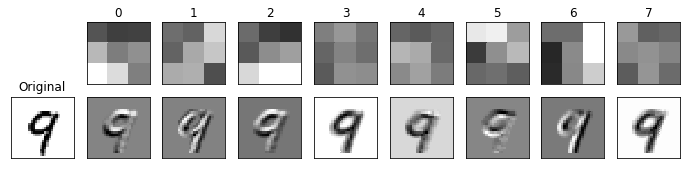

In [ ]:
# 리스트 8-2-(5)
plt.figure(1, figsize=(12, 2.5))
plt.gray()
plt.subplots_adjust(wspace=0.2, hspace=0.2)
plt.subplot(2, 9, 10)
id_img = 12
x_img = x_test[id_img, :, :, 0]
img_h = 28
img_w = 28
x_img = x_img.reshape(img_h, img_w)
plt.pcolor(-x_img)
plt.xlim(0, img_h)
plt.ylim(img_w, 0)
plt.xticks([], "")
plt.yticks([], "")
plt.title("Original")


w = model.layers[0].get_weights()[0] # (A)
max_w = np.max(w)
min_w = np.min(w)
for i in range(8):
    plt.subplot(2, 9, i + 2)
    w1 = w[:, :, 0, i]
    w1 = w1.reshape(3, 3)
    plt.pcolor(-w1, vmin=min_w, vmax=max_w)
    plt.xlim(0, 3)
    plt.ylim(3, 0)
    plt.xticks([], "")
    plt.yticks([], "")
    plt.title("%d" % i)
    plt.subplot(2, 9, i + 11)
    out_img = np.zeros_like(x_img)
    # 필터 처리
    for ih in range(img_h - 3):
        for iw in range(img_w - 3):
            img_part = x_img[ih:ih + 3, iw:iw + 3]
            out_img[ih + 1, iw + 1] = \
            np.dot(img_part.reshape(-1), w1.reshape(-1))
    plt.pcolor(-out_img)
    plt.xlim(0, img_w)
    plt.ylim(img_h, 0)
    plt.xticks([], "")
    plt.yticks([], "")
plt.show()

필터를 살펴보면, 2번 필터는 가로줄의 아래쪽 엣지를 강조하고, 6번 필터는 오른쪽 엣지를 강조하는 것 같다.

이러한 필터가 자동으로 학습되는 것이 흥미롭다.

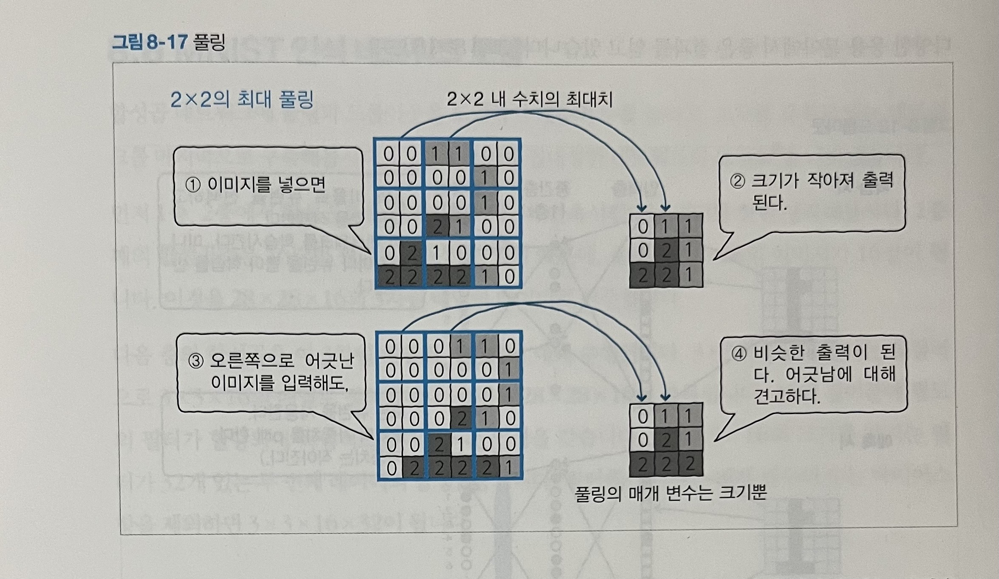

합성곱층은 2차원 이미지가 가지는 특징(위치 정보)를 이용할 수 있었지만, 
이미지 인식과 관련해 중요한 것이 하나 더 있다.

바로, 이미지 위치의 어긋남에 대한 견고성이다.

예를 들어, 필기체 숫자 '2'가 1픽셀만 어긋난 이미지를 입력해도 각 배열의 수치는 완전히 달라진다.

인간의 눈으로는 거의 동일한 입력이지만 네트워크에서는 완전히 다른 패턴으로 인식되어 버린다.

이것은 CNN을 사용해도 마찬가지.

이 문제를 해결하는 방법으로 '풀링 처리'가 있다.

그림은 max pooling의 예이다.

입력 이미지 내의 2x2의 작은 영역에 착안하여 가장 큰 값을 출력값으로 한다.

작은 공간은 스트라이드 2로 이동해 중복 없이 동일 한 처리를 반복.

그 결과, 출력 이미지의 가로 세로 크기는 입력 이미지의 절반이 된다.

-> 입력 이미지가 가로 세로로 어긋나도 거의 변하지 않는 성질을 갖게 된다.

이 풀링층을 네트워크에 도입하여 위치만 어긋난 이미지에 비슷한 출력을 반환하는 성질을 덧붙일 수 있다.

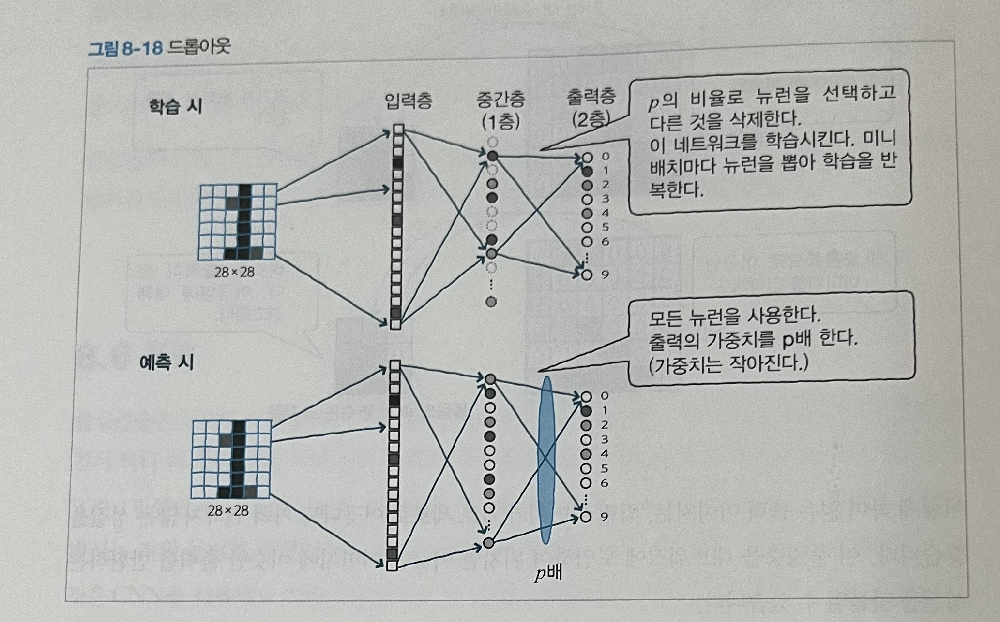

한편, 네트워크의 학습을 개선하는 방법으로 드롭아웃이라는 방법이 2014년 니티시 스리바스타바, 제프리 힌튼 등의 논문에서 제안되었다.

드롭아웃은 학습 시에 입력층의 유닛과 중간층 뉴런을 확률 p (p<1)로 임의로 선택하여, 나머지를 무효화하는 방법이다.

무효화화된 뉴런은 존재하지 않는 것으로 하여 학습을 갱신한다.

미니 배치마다 뉴런을 뽑아 다시 이 절차를 반복한다.

학습 후 예측하는 경우에는 모든 뉴런이 사용된다.

그런데, 학습 시에는 p의 비율의 뉴런밖에 존재하지 않는 상태에서 학습하고 있었는데, 예측 시에 전체 참가가 되면 출력이 커져 버린다 (1/p)배.

-> 그래서 예측 시에는 드롭아웃을 한 층의 출력 대상의 가중치를 p 배로 하여 (p는 1 이하이기 때문에 값이 줄게 된다.) 작게 설정하여 계산을 맞춘다.

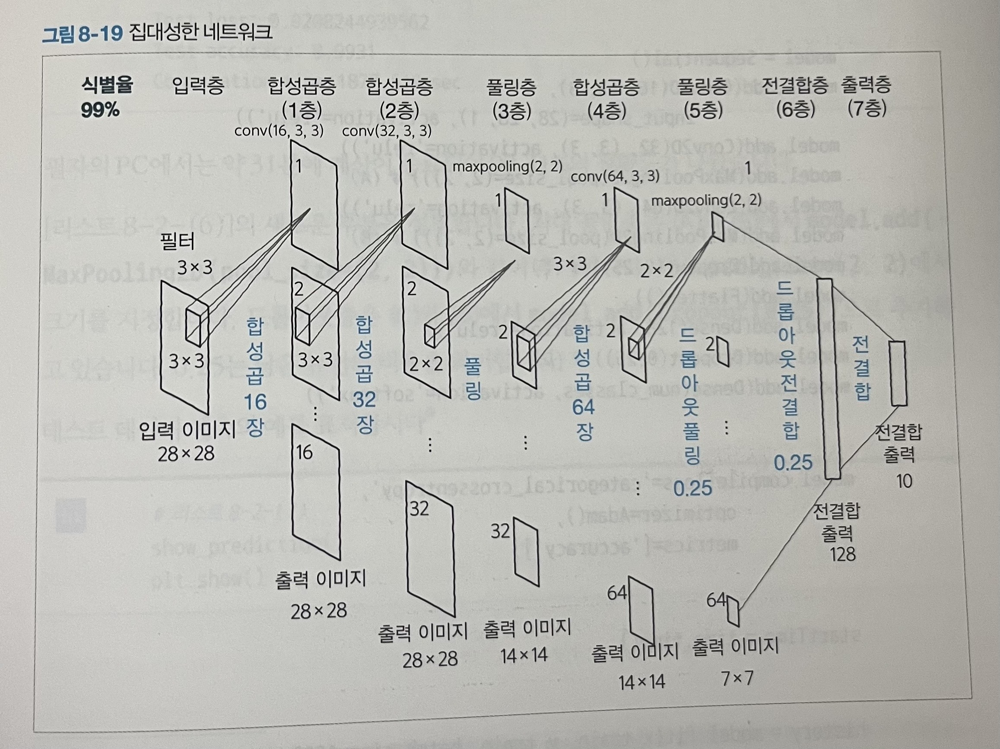

배운 모든 것을 집대성하여 만든 네트워크 구조도이다.

In [ ]:
# 리스트 8-2-(6)
import numpy as np
np.random.seed(1)
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.optimizers import Adam
import time


model = Sequential()
model.add(Conv2D(16, (3, 3),
                 input_shape=(28, 28, 1), activation='relu'))
model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2))) # (A)
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2))) # (B)
model.add(Dropout(0.25)) # (C)
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.25)) # (D)
model.add(Dense(num_classes, activation='softmax'))


model.compile(loss='categorical_crossentropy',
              optimizer=Adam(),
              metrics=['accuracy'])


startTime = time.time()


history = model.fit(x_train, y_train, batch_size=1000, epochs=20,
                    verbose=1, validation_data=(x_test, y_test))


score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])
print("Computation time:{0:.3f} sec".format(time.time() - startTime))


Epoch 1/20
60/60 [==============================] - 5s 64ms/step - loss: 0.7076 - accuracy: 0.7852 - val_loss: 0.1307 - val_accuracy: 0.9596
Epoch 2/20
60/60 [==============================] - 3s 58ms/step - loss: 0.1367 - accuracy: 0.9585 - val_loss: 0.0654 - val_accuracy: 0.9786
Epoch 3/20
60/60 [==============================] - 3s 58ms/step - loss: 0.0924 - accuracy: 0.9722 - val_loss: 0.0470 - val_accuracy: 0.9841
Epoch 4/20
60/60 [==============================] - 3s 58ms/step - loss: 0.0704 - accuracy: 0.9782 - val_loss: 0.0368 - val_accuracy: 0.9872
Epoch 5/20
60/60 [==============================] - 3s 58ms/step - loss: 0.0592 - accuracy: 0.9817 - val_loss: 0.0352 - val_accuracy: 0.9884
Epoch 6/20
60/60 [==============================] - 4s 61ms/step - loss: 0.0507 - accuracy: 0.9845 - val_loss: 0.0285 - val_accuracy: 0.9893
Epoch 7/20
60/60 [==============================] - 4s 59ms/step - loss: 0.0445 - accuracy: 0.9865 - val_loss: 0.0266 - val_accuracy: 0.9902
Epoch 8/20
60

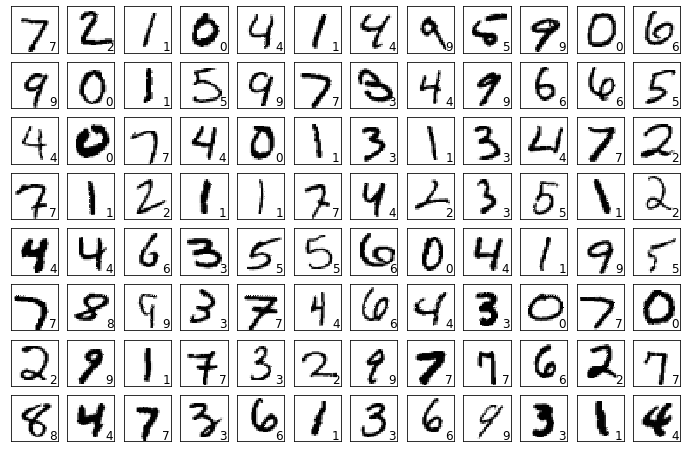

In [ ]:
# 리스트 8-2-(7)
show_prediction()
plt.show()

드디어 잘못된 인식 없이 모두 정답이 되었다.

여기에서는 '모든 기술을 시험한다'는 점에 중점을 두어 네트워크를 디자인했기 때문에, 앞으로는 더 단순하고 정확한 네트워크를 만들 수 있을 것이다.